In [19]:
import pandas as pd
import os
import os.path as osp
import numpy as np
import matplotlib.pylab as plt
import pywt


In [10]:
file_mapping_path = osp.join("..","assets","file_to_session_mapping_20230930-123448.xlsx")
df_map = pd.read_excel(file_mapping_path)
all_df = pd.read_csv("combined_pose_estimation.csv")

In [11]:
df = df_map.loc[~df_map["video_pose_estimation"].isnull(),['rat_number', 'day_number', 'probe_number',
       'cropped_raw_video', 'video_pose_estimation']]

In [27]:
label_cols = ['rat_number', 'day_number', 'probe_number']
all_df.set_index(label_cols, inplace=True)

In [28]:
df_sample = df.iloc[1,:]
df_loaded = pd.read_csv(df_sample.video_pose_estimation)


In [29]:
joint_cols = [a for a in df_loaded.columns if '_x' in a or '_y' in a]
prob_cols = [a.replace('_x','_p') for a in joint_cols if '_x' in a]
cols = joint_cols + prob_cols


In [30]:
unique_inds = all_df.index.unique()
one_rec = all_df.loc[unique_inds[0]]

In [82]:
unique_inds[0]

(1, 1, 4)

In [32]:
one_rec[joint_cols]

Ear_left_1_x  Ear_left_1_y  Ear_right_1_x  \
rat_number day_number probe_number                                              
1          1          4               431.532736    124.633394     431.133034   
                      4               433.131249    125.495654     432.403103   
                      4               434.126843    124.080329     430.079113   
                      4               434.960928    123.617488     430.066242   
                      4               435.177911    124.021002     430.990551   
...                                          ...           ...            ...   
                      4               212.037900    103.157791     174.759578   
                      4               208.235842    108.269410     171.024611   
                      4               205.118887    109.059634     167.495587   
                      4               204.225482    108.655448     166.017453   
                      4               204.248499    110.667184     165.005820   

                                    Ear_right_1_y    Nose_1_x    Nose_1_y  \
rat_number day_number probe_number                                          
1          1          4                 80.178687  403.816611  107.888238   
                      4                 81.489938  403.442128  110.404665   
                      4                 82.002008  408.429611  109.293151   
                      4                 82.599322  408.413206  108.752269   
                      4                 82.729880  405.416410  108.863657   
...                                           ...         ...         ...   
                      4                128.092424  210.052849  146.892516   
                      4                128.808255  206.107481  148.790777   
                      4                130.305854  204.299817  149.303415   
                      4                130.125900  203.642062  149.852676   
                      4                131.245811  202.652440  152.236184   

                                    Center_1_x  Center_1_y  Lat_left_1_x  \
rat_number day_number probe_number                                         
1          1          4             444.671415  101.585715    494.763195   
                      4             444.700000  102.000000    496.608952   
                      4             444.757150  102.371430    496.727420   
                      4             445.042850  102.628570    497.277598   
                      4             445.071450  103.000000    495.239257   
...                                        ...         ...           ...   
                      4             188.342850  108.828575    140.959025   
                      4             184.900000  109.100000    134.914456   
                      4             182.128570  109.971430    132.255104   
                      4             181.571425  109.828575    130.576899   
                      4             181.257140  110.042855    131.442803   

                                    Lat_left_1_y  ...  Center_2_x  Center_2_y  \
rat_number day_number probe_number                ...                           
1          1          4                78.676210  ...   167.90000  125.728570   
                      4                77.805752  ...   169.38571  119.942855   
                      4                77.683424  ...   171.40000  113.642860   
                      4                77.742427  ...   172.35715  106.214285   
                      4                76.410929  ...   173.84285   99.728570   
...                                          ...  ...         ...         ...   
                      4                52.825969  ...   482.00000  213.500000   
                      4                60.248650  ...   482.00000  213.500000   
                      4                69.922871  ...   482.00000  213.500000   
                      4                74.397352  ...   482.00000  213.500000   
                   

In [44]:
fs = 30
n_sec_per_seg = 2
n_frames_per_seg = np.floor(n_sec_per_seg * fs)
n_frames_per_seg
overlap_percent = 0.5

In [45]:
n_frames_per_seg

60.0

In [386]:
joint_cols[0:1]

['Ear_left_1_x']

In [434]:
data = one_rec[joint_cols[:2]].values
data.shape[0]/fs


996.6

In [449]:
data= data.reshape(2, -1)

In [436]:
# current_dir = os.getcwd()
# os.chdir("..")
# from utils.helper_functions import continuous_wavelet_transform
# os.chdir(current_dir)

In [459]:
# f0 = 1/32
# fn = 1

f0 = 1/16
fn = 1

num_frequencies = 5
fs = 30
wavelet = 'morl'
# num_frames_per_segment = int(fs*30000)
frequencies = np.linspace(f0, fn, num_frequencies)/fs
# frequencies = np.logspace(-5, 1, 5, base=2) /fs
scale = pywt.frequency2scale(wavelet, frequencies)


cwt_result, freqs = pywt.cwt(data, scale, wavelet)
# cwt_result, freqs = pywt.cwt(data, scale, wavelet)

# t = np.arange(0, cwt_result.shape[1]) / fs
t = np.arange(0, cwt_result.shape[2]) / fs
# cwt_result = np.abs(cwt_result)
# cwt_result /= np.abs(cwt_result).max()
cwt_result[:,:,0] /= np.abs(cwt_result[:,:,0]).max()
cwt_result[:,:,1] /= np.abs(cwt_result[:,:,1]).max()
# cwt_result = np.log(cwt_result)
# 

In [438]:
# # f0 = 1/32
# # fn = 1

# f0 = 1/8
# fn = 1

# num_frequencies = 50
# fs = 30
# wavelet = 'morl'
# # num_frames_per_segment = int(fs*30000)
# frequencies = np.linspace(f0, fn, num_frequencies)/fs
# # frequencies = np.logspace(-5, 1, 5, base=2) /fs
# scale = pywt.frequency2scale(wavelet, frequencies)

# cwt_result = np.zeros((num_frequencies*2, data.shape[0]))
# cwt_result_temp, freqs = pywt.cwt(data[:,0], scale, wavelet)
# t = np.arange(0, cwt_result.shape[1]) / fs
# # cwt_result = np.abs(cwt_result)
# cwt_result_temp /= np.abs(cwt_result_temp).max()
# cwt_result[:num_frequencies,:] = cwt_result_temp

# cwt_result_temp, freqs = pywt.cwt(data[:,1], scale, wavelet)
# t = np.arange(0, cwt_result.shape[1]) / fs
# # cwt_result = np.abs(cwt_result)
# cwt_result_temp /= np.abs(cwt_result_temp).max()
# cwt_result[num_frequencies:,:] = cwt_result_temp


# # cwt_result = np.log(cwt_result)
# # 

In [451]:
cwt_result_shape = cwt_result.shape
# reshaped_cwt_result = cwt_result.reshape(-1, cwt_result_shape[1], 1,order='F').squeeze()

In [439]:
cwt_result = cwt_result.squeeze()

In [441]:
# t_0 = 70
# step_size = 50
# fig, axes = plt.subplots(2,1, sharex=True)
# plot_ind = range(int(fs*t_0), int(fs*(t_0+step_size)))
# axes[0].pcolormesh(t[plot_ind], frequencies ,cwt_result[:,plot_ind], shading='gouraud')
# # axes[0].pcolormesh(t[plot_ind], range(num_frequencies*2) ,cwt_result[:,plot_ind], shading='gouraud')
# # axes[0].pcolormesh(t[plot_ind], range(reshaped_cwt_result.shape[0]) ,reshaped_cwt_result[:,plot_ind], shading='gouraud')
# axes[1].plot(t[plot_ind], data[plot_ind])

In [442]:
# t_0 = 70
# step_size = 50
# fig, axes = plt.subplots(2,1, sharex=True)
# plot_ind = range(int(fs*t_0), int(fs*(t_0+step_size)))
# # axes[0].pcolormesh(t[plot_ind], frequencies ,cwt_result[:,plot_ind], shading='gouraud')
# axes[0].pcolormesh(t[plot_ind], range(num_frequencies*2) ,cwt_result[:,plot_ind], shading='gouraud')
# # axes[0].pcolormesh(t[plot_ind], range(reshaped_cwt_result.shape[0]) ,reshaped_cwt_result[:,plot_ind], shading='gouraud')
# axes[1].plot(t[plot_ind], data[plot_ind])

In [452]:
cwt_result_shape

(5, 2, 29898)

In [ ]:
# reshaped_cwt_result = np.zeros((cwt_result_shape[0]*2, cwt_result_shape[1]))
# reshaped_cwt_result[:cwt_result_shape[0],:] = cwt_result[:,:,0].squeeze()
# reshaped_cwt_result[cwt_result_shape[0]:,:] = cwt_result[:,:,1].squeeze()

In [453]:
reshaped_cwt_result = np.zeros((cwt_result_shape[0]*2, cwt_result_shape[2]))
reshaped_cwt_result[:cwt_result_shape[0],:] = cwt_result[:,0,:].squeeze()
reshaped_cwt_result[cwt_result_shape[0]:,:] = cwt_result[:,1,:].squeeze()

In [463]:
reshaped_cwt_result = reshaped_cwt_result.transpose()

In [472]:
data.shape

(2, 29898)

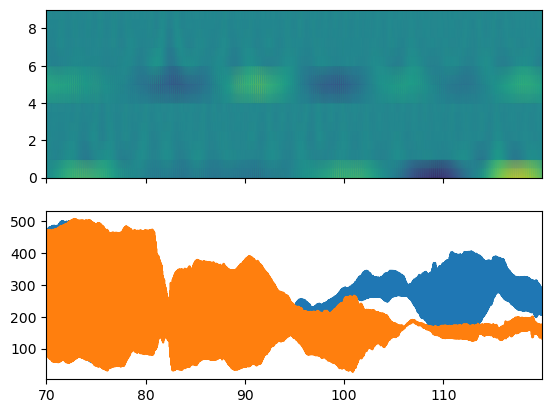

In [473]:
t_0 = 70
step_size = 50
fig, axes = plt.subplots(2,1, sharex=True)
plot_ind = range(int(fs*t_0), int(fs*(t_0+step_size)))
# axes[0].pcolormesh(t[plot_ind], frequencies*fs ,cwt_result[:,plot_ind], shading='gouraud')
axes[0].pcolormesh(t[plot_ind], range(reshaped_cwt_result.shape[0]) ,reshaped_cwt_result[:,plot_ind], shading='gouraud')
axes[1].plot(t[plot_ind], data.transpose()[plot_ind])

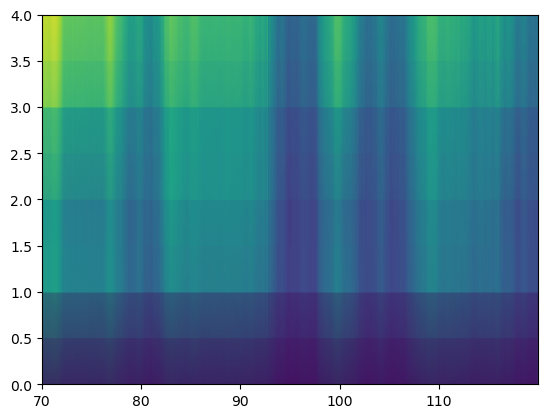

In [377]:
plt.pcolormesh(t[plot_ind], range(cwt_result.shape[0]) ,cwt_result[:,plot_ind,1], shading='gouraud')

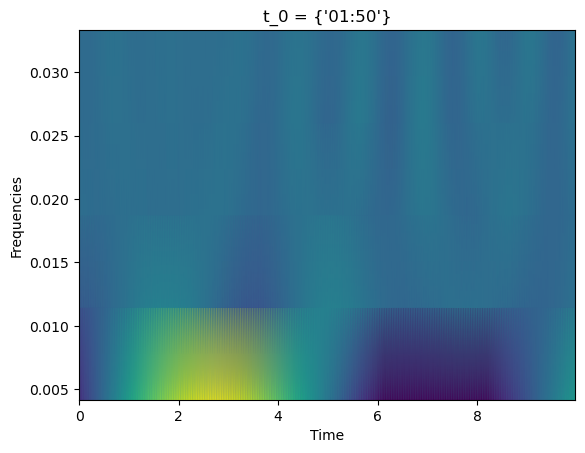

In [290]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from time import strftime, gmtime


# Assuming you have already defined t, frequencies, fs, and cwt_result
fs = 29
t_0 = 20
plot_range = 10
plot_ind = range(int(fs * t_0), int(fs * (t_0 + plot_range)))


fig, ax = plt.subplots()
# pcm = ax.pcolormesh(t[plot_ind], frequencies, cwt_result[:, plot_ind], shading='gouraud')
pcm = ax.pcolormesh(np.arange(len(plot_ind))/fs, frequencies, cwt_result[:, plot_ind], shading='gouraud')
ax.set_xlabel('Time')
ax.set_ylabel('Frequencies')
ax.set_title(f't_0 = {t_0}')

def update(t_0):
    plot_ind = range(int(fs * t_0), int(fs * (t_0 + plot_range)))
    pcm.set_array(cwt_result[:, plot_ind])
#     ax.pcolormesh(t[plot_ind], frequencies, cwt_result[:, plot_ind], shading='gouraud')
    
#     x_values = t[plot_ind]
#     current_ticks = ax.get_xticks()
#     new_ticks = current_ticks - current_ticks[0] + x_values[0]
#     ax.set_xticks(new_ticks)
#     ax.set_xlim(x_values[0] , x_values[-1])
    time_in_minutes = {strftime("%M:%S", gmtime(t_0))}
    ax.set_title(f't_0 = {time_in_minutes}')
    return pcm,

# Define the range of t_0 values for the animation
t_0_values = np.linspace(t_0, (t_0+100)-plot_range, 100)


ani = FuncAnimation(fig, update, frames=t_0_values, blit=True)
# ani.save('cwt_animation.gif', writer='pillow')  # You can save the animation as a GIF

# In Jupyter Notebook, you can display the animation using:
from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
# Step 1 normalize pose

anchor 